# Import all packages

In [1]:
# Import all packages
using DifferentialEquations
using OrdinaryDiffEq
using DiffEqBase
using Sundials
using ODEInterfaceDiffEq
using Plots
using Measures
using CSV
using DataFrames
using Turing
using MCMCChains
using EasyFit
using StatsPlots
using LinearAlgebra
using Random
using Distributions
using OrdinaryDiffEq
Random.seed!(145975);
using CmdStan
using KernelDensity
using LaTeXStrings
using StatsBase

set_cmdstan_home!("C:\\cmdstan\\cmdstan-2.30.0");

┌ Warning: Environment variable CMDSTAN_HOME not set. Use set_cmdstan_home!.
└ @ CmdStan C:\Users\dgomez\.julia\packages\CmdStan\2vwWj\src\CmdStan.jl:27


In [2]:
include("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\FunctionsBayesInfs.jl")

restructDatInfCompRep_RealExpDat_FixScF (generic function with 1 method)

# Extract Data in Stan Format

In [3]:
mainpath = "C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\";
paths = [mainpath*"2Mil_Dat.csv", mainpath*"4Mil_Dat.csv", mainpath*"8Mil_Dat.csv"]

3-element Vector{String}:
 "C:\\IBECPostDocDrive\\2024_01_16_" ⋯ 26 bytes ⋯ "ence\\ProcessedData\\2Mil_Dat.csv"
 "C:\\IBECPostDocDrive\\2024_01_16_" ⋯ 26 bytes ⋯ "ence\\ProcessedData\\4Mil_Dat.csv"
 "C:\\IBECPostDocDrive\\2024_01_16_" ⋯ 26 bytes ⋯ "ence\\ProcessedData\\8Mil_Dat.csv"

In [4]:
dat = restructDatInfNT(paths)

Dict{String, Any} with 14 entries:
  "Means"  => [7719.3 7114.49 7078.58; 5784.22 5374.68 4974.61; … ; -0.332078 -…
  "stsl"   => [78 78 78]
  "obSta"  => [1 2]
  "sts"    => [0 0 0; 15 15 15; … ; 390 390 390; 395 395 395]
  "obser"  => 2
  "Y0us"   => [7719.3 7114.49 7078.58; 0.0 0.0 0.0]
  "ts"     => [1.0e-20 1.0e-20 1.0e-20; 1.0 1.0 1.0; … ; 394.0 394.0 394.0; 395…
  "itp"    => [0.0, 0.0, 0.0]
  "ncells" => [2 4 8]
  "stslm"  => 78
  "tml"    => 396
  "Erros"  => [919.986 706.515 1071.38; 720.006 455.928 835.636; … ; 4.13944 3.…
  "m"      => 3
  "nts"    => [395 395 395]

# Bayesian Inference

In [5]:
modelpath = "C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\HP_PyrLac_SimpleModel.stan";
stream = open(modelpath,"r");
Model = read(stream,String);
close(stream);

StanModel = Stanmodel(name="PyrNoTransport", model=Model, nchains =4,
            num_samples  = 2000, num_warmup = 1000, printsummary=true);
StanModel.method.save_warmup = true;
StanModel.method.adapt.delta = 0.85;
StanModel.method.algorithm.stepsize = 1;
StanModel.method.algorithm.engine.max_depth=10;
StanModel.method.algorithm.stepsize_jitter = 0.5;

In [6]:
rc, chns, cnames = stan(StanModel, dat)#, init = ini) 
# Runs in about 7 min

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: CVode(cvodes_mem, t_final, nv_state_, &t_init, CV_NORMAL) failed with error flag -4: 
Convergence test failures occurred too many times during one internal time step or minimum step size was reached. (in 'c:/IBECPostDocDrive/2024_01_16_NCvsKR/DataProcessingInference/BayesianInference/tmp/PyrNoTransport.stan', line 167, column 9 to column 136)
If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: CVode(cvodes_mem, t_final, nv_state_, &t_init, CV_NORMAL) failed with error flag -4: 
Convergence test failures occurred too many times during one internal time step or m

(0, [-10913.8 0.5 … 41.9441 35.0731; -10913.8 0.0 … 41.9441 35.0731; … ; -2223.6 0.0 … 50.0125 55.4387; -2223.69 0.5 … 50.0151 55.4753;;; -4142.25 1.0 … 43.5126 56.0654; -4142.25 0.0 … 43.5126 56.0654; … ; -2226.2 0.929431 … 49.911 56.1078; -2226.44 0.901642 … 49.9949 56.3017;;; -3719.63 1.0 … 53.9101 60.0889; -3719.63 0.0 … 53.9101 60.0889; … ; -2224.53 0.99906 … 49.9613 55.5718; -2226.62 0.935185 … 49.9027 55.5948;;; -69920.8 0.666667 … 42.5365 42.4041; -69920.8 0.0 … 42.5365 42.4041; … ; -2225.33 0.8 … 50.058 54.3735; -2231.62 0.704618 … 50.0526 53.8199], ["lp__", "accept_stat__", "stepsize__", "treedepth__", "n_leapfrog__", "divergent__", "energy__", "k_f1", "k_r1", "T1_P", "T1_X", "theta.1", "theta.2", "theta.3", "theta.4"])

In [5]:
using JLD2

In [7]:
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\Results\\PyrNoTranspInferRes.jld", "rc", rc, "chns", chns, "cnames", cnames)

UndefVarError: UndefVarError: `rc` not defined

In [10]:
poster = vcat(chns[1001:end, end-3:end, 1], chns[1001:end, end-3:end, 2], chns[1001:end, end-3:end, 3], chns[1001:end, end-3:end, 4])
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\Results\\PosteriorNoTransp.jld", "poster", poster)
CSV.write("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\Results\\PosteriorNoTransp.csv", DataFrame(poster, :auto))

"C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\Results\\PosteriorNoTransp.csv"

In [5]:
poster = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\Results\\PosteriorNoTransp.csv", DataFrame))

8000×4 Matrix{Float64}:
 0.000168675  6.12683e-7  50.2309  55.0184
 0.000168533  7.15852e-7  50.2323  55.0275
 0.000168954  2.5014e-7   50.2596  55.0759
 0.000168999  5.2801e-7   50.2535  55.0935
 0.000169132  3.20263e-7  50.2628  55.1329
 0.000169128  4.68737e-7  50.2657  55.1701
 0.00016918   9.89781e-8  50.2598  55.2279
 0.000169102  2.35328e-7  50.2607  55.2286
 0.000169102  2.35328e-7  50.2607  55.2286
 0.000168876  5.50891e-7  50.2553  55.2723
 ⋮                                 
 0.000171833  7.46618e-8  50.1185  54.339
 0.000171862  1.00572e-6  50.1263  54.3801
 0.000171618  1.29515e-6  50.113   54.6256
 0.000171883  1.62791e-6  50.0607  54.6061
 0.000172424  1.36104e-6  50.0411  54.1545
 0.000172174  1.94414e-6  50.0502  54.1797
 0.000171821  9.08206e-7  50.0698  54.2415
 0.000171669  1.04694e-6  50.058   54.3735
 0.000170363  9.66926e-7  50.0526  53.8199

In [7]:
mean(poster, dims=1)

1×4 Matrix{Float64}:
 0.000168589  2.48858e-6  50.0749  55.2766

# Plot Posteriors Against Priors

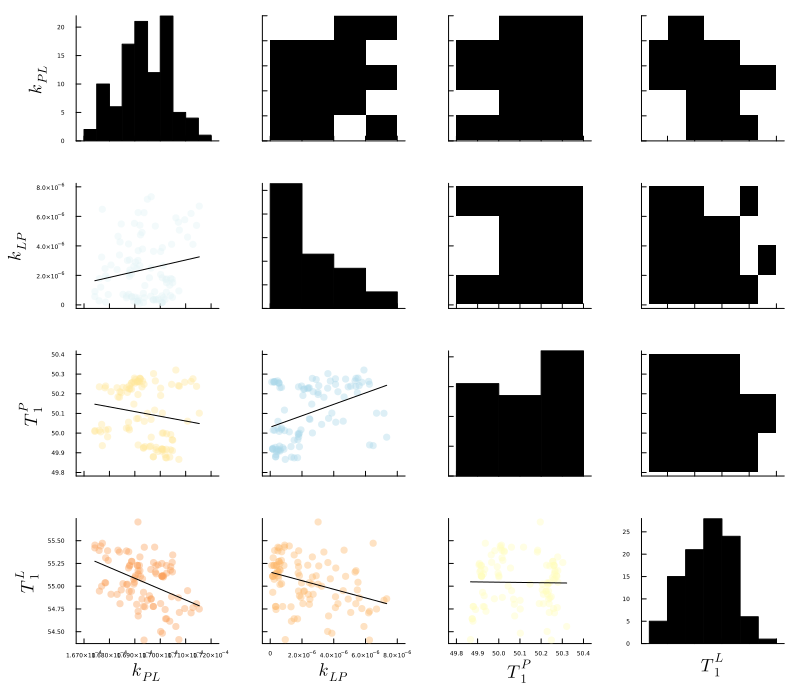

In [6]:
pc = corrplot(poster[1:100, :], label = [L"k_{PL}",L"k_{LP}",L"T_1^P",L"T_1^L"])

fp1 = plot(pc, size=(800,700), xtickfont=font(4), ytickfont=font(4), guidefont=font(12), margin = 2mm, grid=false)


# savefig("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\SVGsInit\\PosteriorNoTransporterCorr.svg")
# savefig("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\SVGsInit\\PosteriorNoTransporterCorr.png")


display(fp1)

In [9]:
using CairoMakie
using PairPlots
using DataFrames

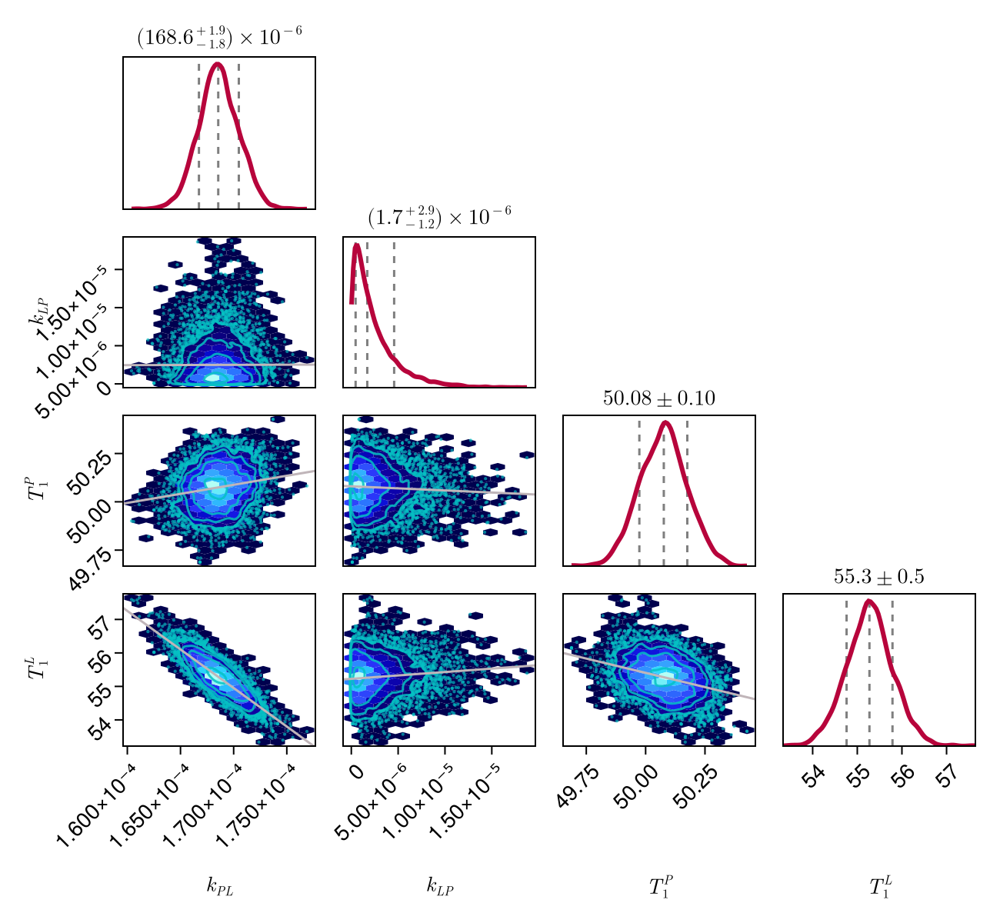

In [10]:
label = [L"k_{PL}",L"k_{LP}",L"T_1^P",L"T_1^L"]
df = DataFrame(poster, :auto)


fig = Figure(size=(650,600))
# 
pairplot(fig[1,1], df => (
    PairPlots.HexBin(colormap=:linear_blue_5_95_c73_n256, alpha=1), # RdYlGn
    PairPlots.Scatter(filtersigma=2, color="#05c1c3ff", markersize=3, alpha=0.65),
    PairPlots.Contour(color="#05c1c3ff", alpha=0.85),
    # # New:
    
    PairPlots.MarginConfidenceLimits(),
    PairPlots.MarginDensity(color="#b7043bff", linewidth=3),
    PairPlots.TrendLine(color="#c0b5b9ff"), # default is red
    
), 
labels = Dict(:x1 => label[1],:x2 => label[2],:x3 => label[3],:x4 => label[4],))

# save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\Figure2Stuff\\PosteriorNoTransporterCorr_NEW.svg", fig)


fig

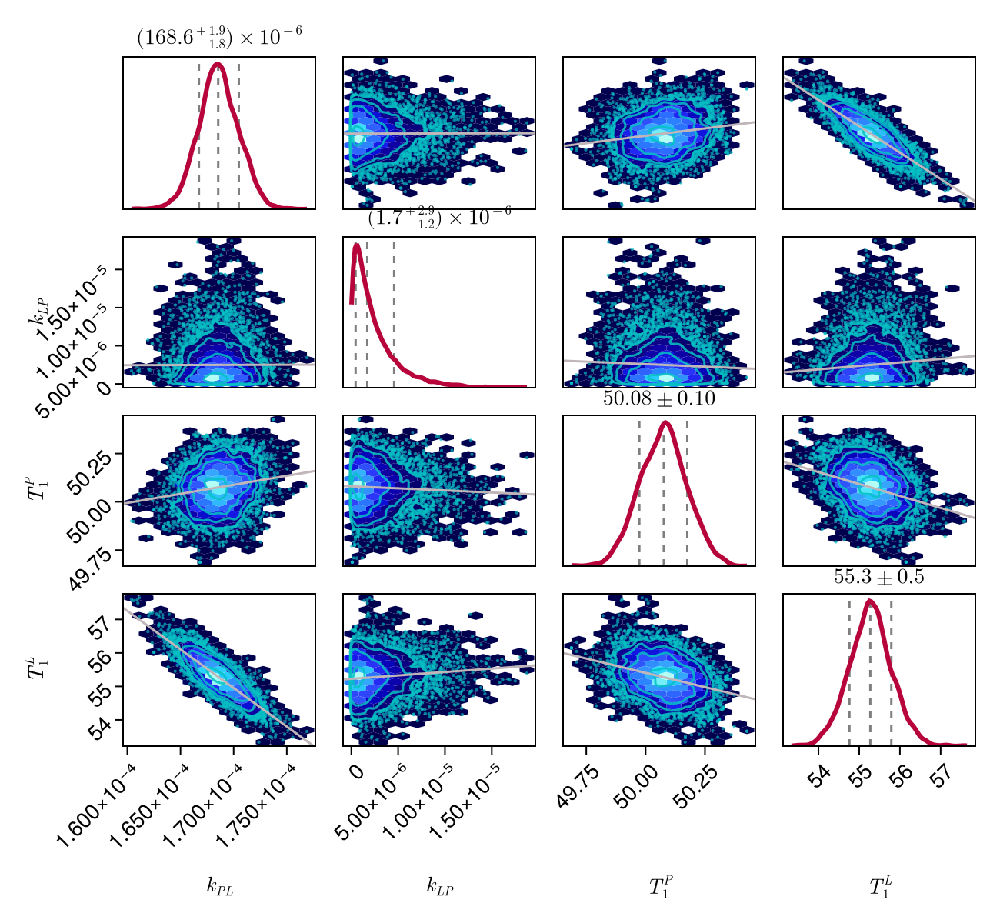

In [14]:
label = [L"k_{PL}",L"k_{LP}",L"T_1^P",L"T_1^L"]
df = DataFrame(poster, :auto)


fig = Figure(size=(650,600))
# 
pairplot(fig[1,1], df => (
    PairPlots.HexBin(colormap=:linear_blue_5_95_c73_n256, alpha=1), # RdYlGn
    PairPlots.Scatter(filtersigma=2, color="#05c1c3ff", markersize=3, alpha=0.65),
    PairPlots.Contour(color="#05c1c3ff", alpha=0.85),
    # # New:
    
    PairPlots.MarginConfidenceLimits(),
    PairPlots.MarginDensity(color="#b7043bff", linewidth=3),
    PairPlots.TrendLine(color="#c0b5b9ff"), # default is red
    
), fullgrid=true,
labels = Dict(:x1 => label[1],:x2 => label[2],:x3 => label[3],:x4 => label[4],))

save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\Figure2Stuff\\PosteriorNoTransporterCorr_NEW_FullGrid.svg", fig)


fig

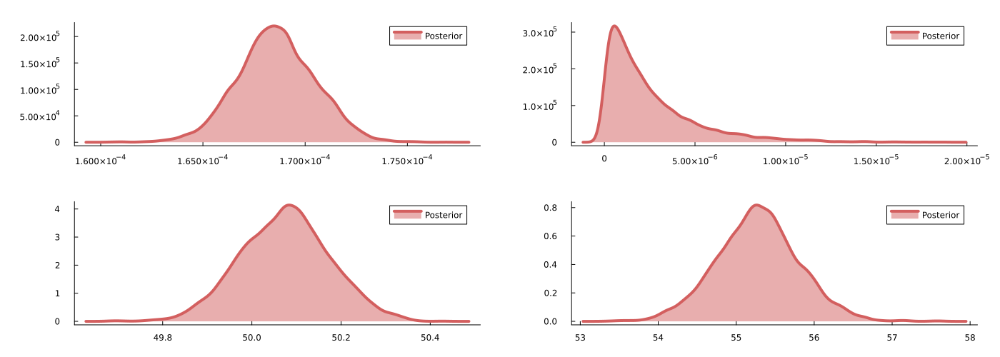

In [8]:
p1 = plot(kde(poster[:,1]), label = "Posterior", linewidth = 4, color = "#d35f5fff", fill=(0, .5))

p2 = plot(kde(poster[:,2]), label = "Posterior", linewidth = 4, color = "#d35f5fff", fill=(0, .5))

p3 = plot(kde(poster[:,3]), label = "Posterior", linewidth = 4, color = "#d35f5fff", fill=(0, .5))

p4 = plot(kde(poster[:,4]), label = "Posterior", linewidth = 4, color = "#d35f5fff", fill=(0, .5))



plot(p1,p2,p3,p4, size = (1400,500), margin = 6mm, grid=false)

# savefig("PosteriorTest.svg")

plot(p1,p2,p3,p4, size = (1400,500), margin = 6mm, grid=false)


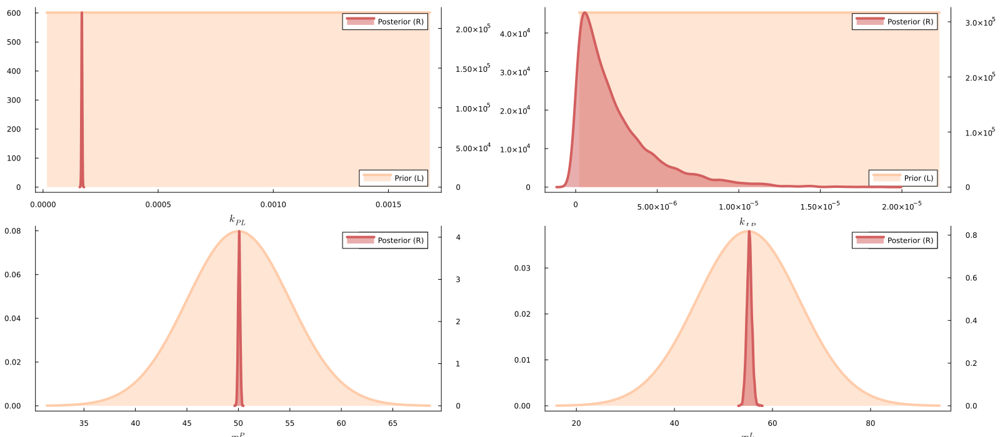

In [6]:
p1 = plot(Uniform(1.68e-5, 0.00168), label = "Prior (L)", xlabel = L"k_{PL}", linewidth = 4, color = "#ffccaaff", fill=(0, .5))
plot!(twinx(), kde(poster[:,1]), label = "Posterior (R)", linewidth = 4, color = "#d35f5fff", fill=(0, .5))

p2 = plot(Uniform(2.23e-7, 2.23e-5), label = "Prior (L)", xlabel = L"k_{LP}", linewidth = 4, color = "#ffccaaff", fill=(0, .5))
plot!(twinx(), kde(poster[:,2]), label = "Posterior (R)", linewidth = 4, color = "#d35f5fff", fill=(0, .5))

p3 = plot(Normal(50, 5), label = "Prior (L)", xlabel = L"T_1^P", linewidth = 4, color = "#ffccaaff", fill=(0, .5))
plot!(twinx(), kde(poster[:,3]), label = "Posterior (R)", linewidth = 4, color = "#d35f5fff", fill=(0, .5))

p4 = plot(Normal(55, 10.5), label = "Prior (L)", xlabel = L"T_1^L", linewidth = 4, color = "#ffccaaff", fill=(0, .5))
plot!(twinx(), kde(poster[:,4]), label = "Posterior (R)", linewidth = 4, color = "#d35f5fff", fill=(0, .5))



plot(p1,p2,p3,p4, size = (1600,700), margin = 10mm, grid=false)

# savefig("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\SVGsInit\\PriorPosteriorNoTransporter.svg")

plot(p1,p2,p3,p4, size = (1600,700), margin = 10mm, grid=false)


In [8]:
Ht = [entropy(Uniform(1.68e-5, 0.00168)), entropy(Uniform(2.23e-7, 2.23e-5)), entropy(Normal(50, 5)), entropy(Normal(55, 10.5))]

4-element Vector{Float64}:
  -6.399011821420471
 -10.720974215351703
   3.0283764456387727
   3.7703137903681503

In [27]:
include("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\EntropyEstimationPosterior.jl")
H_U_Post1, H_Post1, H_L_Post1 = entroSing(poster[:,1:1]);
H_U_Post2, H_Post2, H_L_Post2 = entroSing(poster[:,2:2]);
H_U_Post3, H_Post3, H_L_Post3 = entroSing(poster[:,3:3]);
H_U_Post4, H_Post4, H_L_Post4 = entroSing(poster[:,4:4]);

K-means converged with 1 iterations (objv = 2.7022098581719967e-9)
K-means converged with 1 iterations (objv = 3.669996275866982e-9)
K-means converged with 1 iterations (objv = 2.6736496251501044e-9)
K-means converged with 1 iterations (objv = 2.168490332774589e-9)


┌ Info: Initializing GMM, 2 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 2000 data points using 1 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 2 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 2000 data points using 1 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 2 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 2000 data points using 1 iterations
│ 500.0 data points per param

K-means converged with 1 iterations (objv = 2.280126511730275e-9)
K-means converged with 1 iterations (objv = 2.0602657266102814e-9)
K-means converged with 1 iterations (objv = 2.1178463314224492e-9)
K-means converged with 1 iterations (objv = 2.1822131017101854e-9)


┌ Info: Initializing GMM, 3 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 3000 data points using 1 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 3 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 3000 data points using 1 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 1 iterations
│ 500.0 data points per param

K-means converged with 1 iterations (objv = 2.1090745354245406e-9)
K-means converged with 1 iterations (objv = 1.8560357042340729e-9)
K-means converged with 1 iterations (objv = 1.984132327118561e-9)


┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 1 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 5 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5000 data points using 1 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 5 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5000 data points using 1 iterations
│ 500.0 data points per param

K-means converged with 1 iterations (objv = 1.813008936769418e-9)
K-means converged with 1 iterations (objv = 1.7823868961831719e-9)


┌ Info: Initializing GMM, 5 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5000 data points using 1 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 6 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 1 iterations
│ 444.4 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 1 iterations (objv = 1.4743948615848446e-9)
K-means converged with 1 iterations (objv = 1.8375491017054477e-9)
K-means converged with 1 iterations (objv = 1.0003556545324343e-9)


┌ Info: Initializing GMM, 6 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 1 iterations
│ 444.4 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 6 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 1 iterations
│ 444.5 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 7 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means converged with 1 iterations (objv = 1.0260292583052761e-9)
K-means converged with 1 iterations (objv = 1.1006484515659743e-9)


┌ Info: K-means with 5333 data points using 1 iterations
│ 380.9 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 7 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 1 iterations
│ 380.9 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 7 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 1 iterations
│ 381.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 1 iterations (objv = 1.0321984399895265e-9)
K-means converged with 1 iterations (objv = 9.714544785412112e-10)


┌ Info: Initializing GMM, 8 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 1 iterations
│ 333.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 8 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 1 iterations
│ 333.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 1 iterations (objv = 8.191754773931641e-10)
K-means converged with 1 iterations (objv = 7.869580258311554e-10)


┌ Info: Initializing GMM, 8 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 1 iterations
│ 333.4 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 9 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means converged with 1 iterations (objv = 6.960450223937309e-10)
K-means converged with 1 iterations (objv = 6.058197049352137e-10)


┌ Info: K-means with 5333 data points using 1 iterations
│ 296.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 9 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 1 iterations
│ 296.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 9 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 1 iterations
│ 296.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 1 iterations (objv = 5.780737625624414e-10)
K-means converged with 1 iterations (objv = 5.675141387172551e-10)


┌ Info: Initializing GMM, 10 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 1 iterations
│ 266.6 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 10 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 1 iterations
│ 266.6 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 1 iterations (objv = 6.209402713208824e-10)
K-means converged with 1 iterations (objv = 2.1036562393644035e-9)


┌ Info: Initializing GMM, 10 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 1 iterations
│ 266.7 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means converged with 1 iterations (objv = 2.464355644274421e-9)
K-means converged with 1 iterations (objv = 2.4826741568526067e-9)
K-means converged with 1 iterations (objv = 1.971782769936097e-9)


┌ Info: K-means with 4000 data points using 1 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 1 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 1 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 8000 data p

              Iteration 1 of 4
              Iteration 2 of 4
              Iteration 3 of 4
              Iteration 4 of 4
K-means converged with 1 iterations (objv = 4.836095479768788e-9)
K-means converged with 1 iterations (objv = 5.139676428128139e-9)
K-means converged with 1 iterations (objv = 4.025255306983519e-9)


┌ Info: K-means with 4000 data points using 1 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 2 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 2000 data points using 1 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 2 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 2000 data points using 1 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 2 Gaussians diag covariance 1 dimensions using 5334 data p

K-means converged with 1 iterations (objv = 3.4146998105661758e-9)
K-means converged with 1 iterations (objv = 3.472295000866017e-9)
K-means converged with 1 iterations (objv = 3.1100614188186372e-9)


┌ Info: Initializing GMM, 3 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 3000 data points using 1 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 3 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 3000 data points using 1 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 3 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 3000 data points using 1 iterations
│ 500.0 data points per param

K-means converged with 1 iterations (objv = 2.8918404034848064e-9)
K-means converged with 1 iterations (objv = 3.30901970306284e-9)
K-means converged with 1 iterations (objv = 3.83695797002344e-9)


┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 1 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 1 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 1 iterations
│ 500.0 data points per param

K-means converged with 1 iterations (objv = 2.4155259778462406e-9)
K-means converged with 1 iterations (objv = 3.0581658508000085e-9)
K-means converged with 1 iterations (objv = 2.8515198418383037e-9)


┌ Info: Initializing GMM, 5 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5000 data points using 1 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 5 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5000 data points using 1 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 5 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5000 data points using 1 iterations
│ 500.0 data points per param

K-means converged with 1 iterations (objv = 1.950766419424333e-9)
K-means converged with 1 iterations (objv = 2.196222945997647e-9)


┌ Info: Initializing GMM, 6 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 1 iterations
│ 444.4 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 6 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means converged with 1 iterations (objv = 1.8484882850224958e-9)
K-means converged with 1 iterations (objv = 1.5297641970881503e-9)


┌ Info: K-means with 5333 data points using 1 iterations
│ 444.4 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 6 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 1 iterations
│ 444.5 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 7 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 1 iterations
│ 380.9 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 1 iterations (objv = 1.3028572819085984e-9)
K-means converged with 1 iterations (objv = 1.2901573145519867e-9)


┌ Info: Initializing GMM, 7 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 1 iterations
│ 380.9 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 7 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 1 iterations
│ 381.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 1 iterations (objv = 9.92047213263581e-10)
K-means converged with 1 iterations (objv = 1.2874067320022272e-9)


┌ Info: Initializing GMM, 8 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 1 iterations
│ 333.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 8 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 1 iterations
│ 333.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 1 iterations (objv = 1.0299180255859192e-9)
K-means converged with 1 iterations (objv = 1.0307199982426605e-9)


┌ Info: Initializing GMM, 8 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 1 iterations
│ 333.4 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 9 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means converged with 1 iterations (objv = 7.832460893885203e-10)
K-means converged with 1 iterations (objv = 8.637918779274337e-10)


┌ Info: K-means with 5333 data points using 1 iterations
│ 296.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 9 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 1 iterations
│ 296.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 9 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 1 iterations
│ 296.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 1 iterations (objv = 7.183135325330688e-10)
K-means converged with 1 iterations (objv = 8.85171795913665e-10)


┌ Info: Initializing GMM, 10 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 1 iterations
│ 266.6 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 10 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 1 iterations
│ 266.6 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 1 iterations (objv = 5.774429829143065e-10)
K-means converged with 1 iterations (objv = 1.365805291971686e-9)


┌ Info: Initializing GMM, 10 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 1 iterations
│ 266.7 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 10 Gaussians diag covariance 1 dimensions using 8000 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 8000 data points using 1 iterations
│ 400.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 1 iterations (objv = 5.3235488421790356e-11)


┌ Info: Initializing GMM, 40 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 1 iterations
│ 66.7 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 1 iterations (objv = 4.490996516462714e-11)


┌ Info: Initializing GMM, 40 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 1 iterations
│ 66.7 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 1 iterations (objv = 3.8318801532527093e-11)


┌ Info: Initializing GMM, 40 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 1 iterations
│ 66.7 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 1 iterations (objv = 6.43623722618523e-11)


┌ Info: Initializing GMM, 40 Gaussians diag covariance 1 dimensions using 8000 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 8000 data points using 1 iterations
│ 100.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


              Iteration 1 of 40
              Iteration 2 of 40
              Iteration 3 of 40
              Iteration 4 of 40
              Iteration 5 of 40
              Iteration 6 of 40
              Iteration 7 of 40
              Iteration 8 of 40
              Iteration 9 of 40
              Iteration 10 of 40
              Iteration 11 of 40
              Iteration 12 of 40
              Iteration 13 of 40
              Iteration 14 of 40
              Iteration 15 of 40
              Iteration 16 of 40
              Iteration 17 of 40
              Iteration 18 of 40
              Iteration 19 of 40
              Iteration 20 of 40
              Iteration 21 of 40
              Iteration 22 of 40
              Iteration 23 of 40
              Iteration 24 of 40
              Iteration 25 of 40
              Iteration 26 of 40
              Iteration 27 of 40
              Iteration 28 of 40
              Iteration 29 of 40
              Iteration 30 of 40
              Itera

┌ Info: Initializing GMM, 2 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 2000 data points using 14 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 2 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 2000 data points using 19 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 2 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 2000 data points using 14 iterations
│ 500.0 data points per pa

K-means converged with 17 iterations (objv = 5.479736083641001)
K-means converged with 9 iterations (objv = 5.344652956428945)
K-means converged with 24 iterations (objv = 5.682904418293219)
K-means converged with 36 iterations (objv = 4.618756902279529)


┌ Info: Initializing GMM, 3 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 3000 data points using 17 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 3 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 3000 data points using 9 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 3 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 3000 data points using 24 iterations
│ 500.0 data points per par

K-means converged with 34 iterations (objv = 4.5573438959745545)
K-means converged with 19 iterations (objv = 4.778210361036145)
K-means converged with 19 iterations (objv = 3.8202475601410697)


┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 34 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 19 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 5 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5000 data points using 19 iterations
│ 500.0 data points per pa

K-means converged with 35 iterations (objv = 3.9035674697988725)
K-means converged with 12 iterations (objv = 4.05265384937411)


┌ Info: Initializing GMM, 5 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5000 data points using 35 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 5 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5000 data points using 12 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 46 iterations (objv = 2.9727994975119145)
K-means converged with 33 iterations (objv = 3.062515109224478)


┌ Info: Initializing GMM, 6 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 46 iterations
│ 444.4 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 6 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 33 iterations
│ 444.4 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means terminated without convergence after 50 iterations (objv = 3.1325081065897393)
K-means terminated without convergence after 50 iterations (objv = 2.2276485367765417)


┌ Info: Initializing GMM, 6 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 50 iterations
│ 444.5 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 7 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means converged with 49 iterations (objv = 2.3136539619836185)
K-means terminated without convergence after 50 iterations (objv = 2.382833070350898)


┌ Info: K-means with 5333 data points using 50 iterations
│ 380.9 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 7 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 49 iterations
│ 380.9 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 7 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means converged with 29 iterations (objv = 1.7524565658295614)
K-means terminated without convergence after 50 iterations (objv = 1.8777466283672766)


┌ Info: K-means with 5334 data points using 50 iterations
│ 381.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 8 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 29 iterations
│ 333.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 8 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means converged with 31 iterations (objv = 1.8750653528886687)
K-means converged with 31 iterations (objv = 1.4059964719290292)


┌ Info: K-means with 5333 data points using 50 iterations
│ 333.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 8 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 31 iterations
│ 333.4 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 9 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 31 iterations
│ 296.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 27 iterations (objv = 1.4942452759032676)
K-means terminated without convergence after 50 iterations (objv = 1.5317982289670908)


┌ Info: Initializing GMM, 9 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 27 iterations
│ 296.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 9 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means converged with 49 iterations (objv = 1.172921358259373)
K-means terminated without convergence after 50 iterations (objv = 1.2292477470919039)


┌ Info: K-means with 5334 data points using 50 iterations
│ 296.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 10 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 49 iterations
│ 266.6 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 10 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means converged with 32 iterations (objv = 1.276667636887396)
K-means converged with 34 iterations (objv = 4.498214254238519)


┌ Info: K-means with 5333 data points using 50 iterations
│ 266.6 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 10 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 32 iterations
│ 266.7 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means converged with 10 iterations (objv = 4.585111623821831)
K-means converged with 32 iterations (objv = 4.762262400137843)
K-means converged with 26 iterations (objv = 4.421935540326558)


┌ Info: K-means with 4000 data points using 34 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 10 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 32 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 8000 dat

              Iteration 1 of 4
              Iteration 2 of 4
              Iteration 3 of 4
              Iteration 4 of 4
K-means converged with 19 iterations (objv = 220.23087136408594)
K-means converged with 13 iterations (objv = 232.6792614218857)
K-means converged with 11 iterations (objv = 206.8213974687178)
K-means converged with 22 iterations (objv = 165.4678180983874)
K-means converged with 19 iterations (objv = 165.39942680365948)


┌ Info: K-means with 4000 data points using 26 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 2 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 2000 data points using 19 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 2 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 2000 data points using 13 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 2 Gaussians diag covariance 1 dimensions using 5334 dat

K-means converged with 30 iterations (objv = 165.49929635653734)
K-means converged with 32 iterations (objv = 139.02893017571478)
K-means converged with 23 iterations (objv = 139.92419758872893)


┌ Info: Initializing GMM, 3 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 3000 data points using 30 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 32 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 23 iterations
│ 500.0 data points per pa

K-means terminated without convergence after 50 iterations (objv = 132.45702746025654)
K-means converged with 27 iterations (objv = 123.0889050836422)
K-means converged with 48 iterations (objv = 126.26380301800418)


┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 50 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 5 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5000 data points using 27 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 5 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means converged with 30 iterations (objv = 112.26516258379525)
K-means terminated without convergence after 50 iterations (objv = 92.18048775928037)


┌ Info: K-means with 5000 data points using 48 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 5 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5000 data points using 30 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 6 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 50 iterations
│ 444.4 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 6 Gaussians diag covariance 1 dimensions using 5333 dat

K-means converged with 44 iterations (objv = 95.1633648291745)
K-means terminated without convergence after 50 iterations (objv = 86.71079100538554)
K-means converged with 27 iterations (objv = 70.42698721068973)


┌ Info: K-means with 5333 data points using 44 iterations
│ 444.4 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 6 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 50 iterations
│ 444.5 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 7 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 27 iterations
│ 380.9 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means terminated without convergence after 50 iterations (objv = 72.74170390747076)
K-means terminated without convergence after 50 iterations (objv = 64.40427254650513)


┌ Info: Initializing GMM, 7 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 50 iterations
│ 380.9 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 7 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 50 iterations
│ 381.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means converged with 34 iterations (objv = 55.79045686336758)
K-means terminated without convergence after 50 iterations (objv = 60.1493252813234)


┌ Info: Initializing GMM, 8 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 34 iterations
│ 333.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 8 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 50 iterations
│ 333.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means terminated without convergence after 50 iterations (objv = 50.752610831174024)
K-means converged with 31 iterations (objv = 44.62202908858126)


┌ Info: Initializing GMM, 8 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 50 iterations
│ 333.4 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 9 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means converged with 35 iterations (objv = 48.42860616621874)
K-means converged with 31 iterations (objv = 42.57135681382533)


┌ Info: K-means with 5333 data points using 31 iterations
│ 296.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 9 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 35 iterations
│ 296.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 9 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means converged with 37 iterations (objv = 36.54383171165591)
K-means converged with 42 iterations (objv = 39.79593797096095)


┌ Info: K-means with 5334 data points using 31 iterations
│ 296.3 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 10 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 37 iterations
│ 266.6 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 10 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5333 data points using 42 iterations
│ 266.6 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141


K-means terminated without convergence after 50 iterations (objv = 35.98103258631181)
K-means converged with 43 iterations (objv = 138.8878951635952)


┌ Info: Initializing GMM, 10 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 5334 data points using 50 iterations
│ 266.7 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79


K-means converged with 18 iterations (objv = 137.67954106181696)
K-means converged with 15 iterations (objv = 131.5124353180954)
K-means converged with 37 iterations (objv = 140.84184431288395)


┌ Info: K-means with 4000 data points using 43 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5333 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 18 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 5334 data points
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:79
┌ Info: K-means with 4000 data points using 15 iterations
│ 500.0 data points per parameter
└ @ GaussianMixtures C:\Users\dgomez\.julia\packages\GaussianMixtures\yHlNS\src\train.jl:141
┌ Info: Initializing GMM, 4 Gaussians diag covariance 1 dimensions using 8000 dat

              Iteration 1 of 4
              Iteration 2 of 4
              Iteration 3 of 4
              Iteration 4 of 4


In [30]:
Htd = [H_Post1[1], H_Post2[1], H_Post3[1], H_Post4[1]]

4-element Vector{Float64}:
 -10.994401941435857
 -10.821346893416893
   0.01256701361914457
   1.5998727187832653

In [31]:
Ht - Htd

4-element Vector{Float64}:
 4.595390120015386
 0.1003726780651899
 3.015809432019628
 2.170441071584885

# Simulate Posterior Prediction (Quantiles)

In [7]:
include("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\InitalParameterFitPriorDef\\ModelFunctionsAll.jl")

PyruvateHP_NMR_SolveAllMM (generic function with 1 method)

In [8]:
dat2 = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\2Mil_Dat.csv", DataFrame));
dat4 = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\4Mil_Dat.csv", DataFrame));
dat8 = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\8Mil_Dat.csv", DataFrame));

dat = [dat2, dat4, dat8];

## Prior Prediction (Check)

In [11]:
Random.seed!(565874865134); 

kPL = rand(Uniform(1.68e-5, 0.00168), 8000);
kLP = rand(Uniform(2.23e-8, 2.23e-4), 8000);
T1P = rand(Normal(50, 5), 8000);
T1L = rand(Normal(55, 10.5), 8000);

prior2 = hcat(kPL.*2, kLP.*2, T1P, T1L, zeros(8000));
prior4 = hcat(kPL.*4, kLP.*4, T1P, T1L, zeros(8000));
prior8 = hcat(kPL.*8, kLP.*8, T1P, T1L, zeros(8000));

In [12]:
tsC2 = dat2[:,1]
ts = 0:tsC2[end];
ivss = [dat2[1,2], dat2[1,4]];
samps = convert.(Int, tsC2);
SimOnTime1prior, SimOffTime1prior, SimAll1prior  = PyruvateHP_NMR_SolveAll(ts, prior2, ivss, samps);

tsC4 = dat4[:,1]
ts = 0:tsC4[end];
ivss = [dat4[1,2], dat4[1,4]];
samps = convert.(Int, tsC4);
SimOnTime2prior, SimOffTime2prior, SimAll2prior  = PyruvateHP_NMR_SolveAll(ts, prior4, ivss, samps);

tsC8 = dat8[:,1]
ts = 0:tsC8[end];
ivss = [dat8[1,2], dat8[1,4]];
samps = convert.(Int, tsC8);
SimOnTime3prior, SimOffTime3prior, SimAll3prior  = PyruvateHP_NMR_SolveAll(ts, prior8, ivss, samps);

In [13]:
priorSims = [SimOnTime1prior, SimOnTime2prior, SimOnTime3prior];

In [14]:
# Dims = Up/Down, Observable, Experiment
PriorQuant = Array{Any}(undef,2,2,3);

for k in 1:2
    for m in 1:3
        PriorQuant[1,k,m] = [percentile(priorSims[m][j,k,:], 99.5) for j in 1:size(priorSims[m][:,k,1])[1]]; # Up
        PriorQuant[2,k,m] = [percentile(priorSims[m][j,k,:], 0.5 ) for j in 1:size(priorSims[m][:,k,1])[1]]; # Down
    end
end


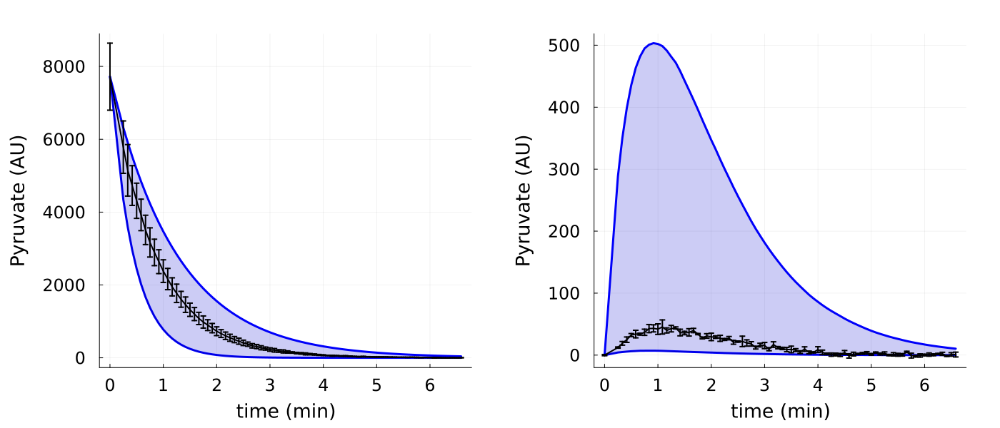

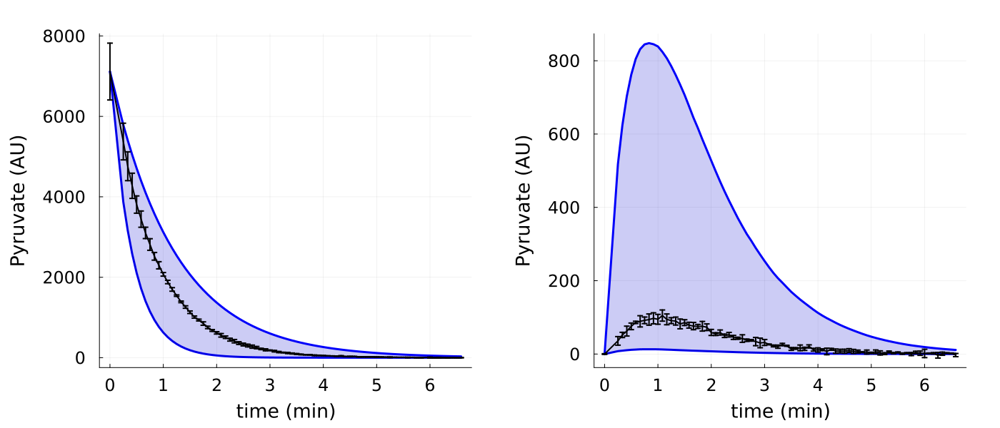

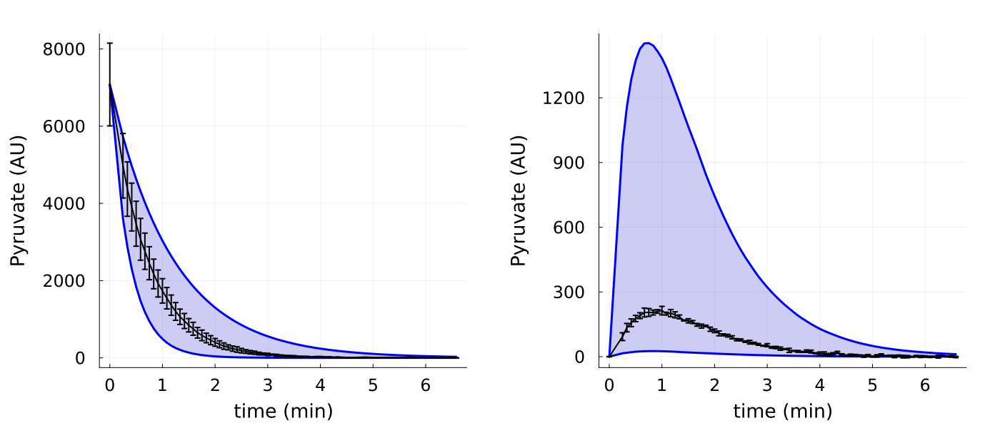

In [15]:
m = 1
for m in 1:3
  pr = plot(tsC2./60, PriorQuant[1,1,m], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
  plot!(tsC2./60, PriorQuant[2,1,m], label = "", color = "blue", linewidth = 3)
  plot!(tsC2./60, PriorQuant[2,1,m], fillrange=PriorQuant[1,1,m], label="", color="blue3", fillalpha=0.2)
  plot!(tsC2./60, dat[m][:,2], yerror = dat[m][:,3], linewidth = 2, colour = "black", label = "")

  po = plot(tsC2./60, PriorQuant[1,2,m], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
  plot!(tsC2./60, PriorQuant[2,2,m], label = "", color = "blue", linewidth = 3)
  plot!(tsC2./60, PriorQuant[2,2,m], fillrange=PriorQuant[1,2,m], label="", color="blue3", fillalpha=0.2)
  plot!(tsC2./60, dat[m][:,4], yerror = dat[m][:,5], linewidth = 2, colour = "black", label = "")

  display(plot(pr, po, size = (1400, 600)))
end

## Posterior Prediction

In [9]:
tsC2 = dat2[:,1]
ts = 0:tsC2[end];
ivss = [dat2[1,2], dat2[1,4]];
samps = convert.(Int, tsC2);
SimOnTime1poster, SimOffTime1poster, SimAll1poster  = PyruvateHP_NMR_SolveAll(ts, hcat(poster[:,1:2].*2, poster[:,4], poster[:,3], zeros(8000)), ivss, samps);

tsC4 = dat4[:,1]
ts = 0:tsC4[end];
ivss = [dat4[1,2], dat4[1,4]];
samps = convert.(Int, tsC4);
SimOnTime2poster, SimOffTime2poster, SimAll2poster  = PyruvateHP_NMR_SolveAll(ts, hcat(poster[:,1:2].*4, poster[:,4], poster[:,3], zeros(8000)), ivss, samps);

tsC8 = dat8[:,1]
ts = 0:tsC8[end];
ivss = [dat8[1,2], dat8[1,4]];
samps = convert.(Int, tsC8);
SimOnTime3poster, SimOffTime3poster, SimAll3poster  = PyruvateHP_NMR_SolveAll(ts, hcat(poster[:,1:2].*8, poster[:,4], poster[:,3], zeros(8000)), ivss, samps);

In [10]:
posterSims = [SimOnTime1poster, SimOnTime2poster, SimOnTime3poster];

In [11]:
# Dims = Up/Down, Observable, Experiment
PosterQuant = Array{Any}(undef,2,2,3);

for k in 1:2
    for m in 1:3
        PosterQuant[1,k,m] = [percentile(posterSims[m][j,k,:], 99.5) for j in 1:size(posterSims[m][:,k,1])[1]]; # Up
        PosterQuant[2,k,m] = [percentile(posterSims[m][j,k,:], 0.5 ) for j in 1:size(posterSims[m][:,k,1])[1]]; # Down
    end
end

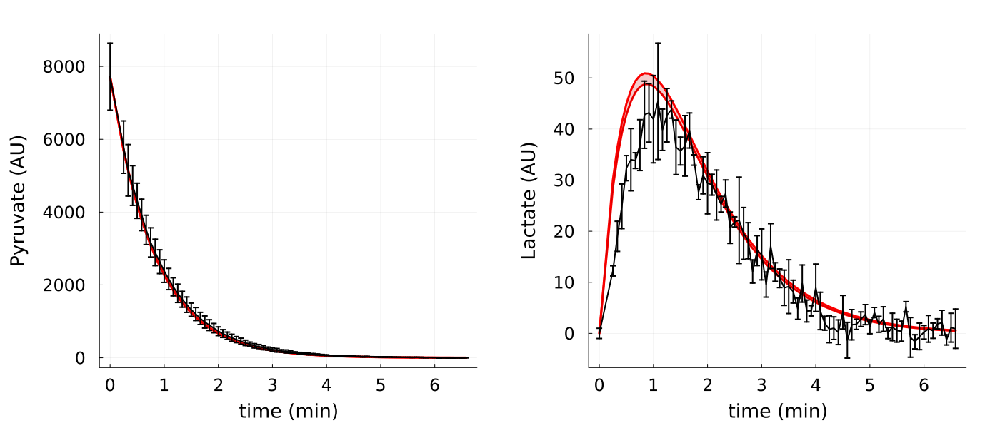

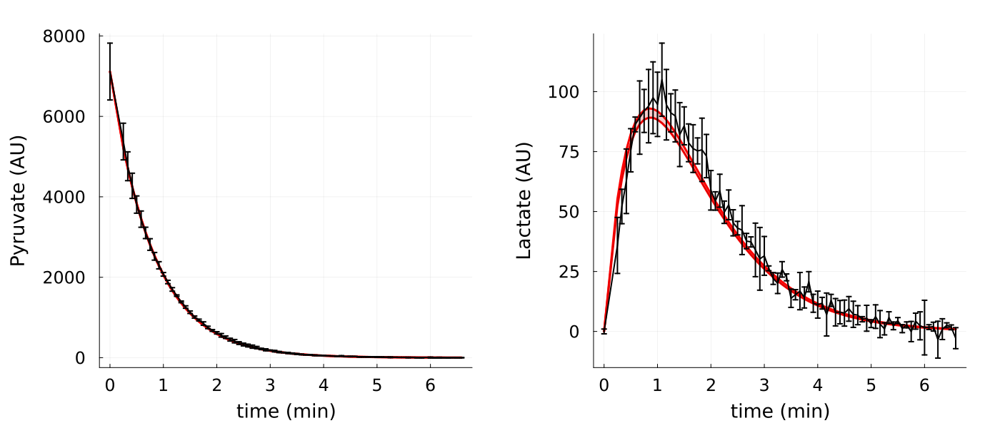

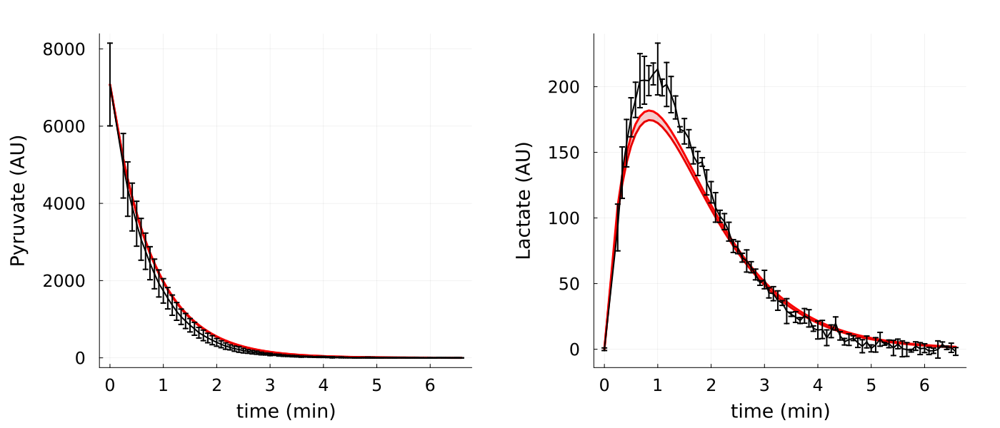

In [12]:
m=1
for m in 1:3
  pr = plot(tsC2./60, PosterQuant[1,1,m], label = "", color = "red", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
  plot!(tsC2./60, PosterQuant[2,1,m], label = "", color = "red", linewidth = 3)
  plot!(tsC2./60, PosterQuant[2,1,m], fillrange=PosterQuant[1,1,m], label="", color="red3", fillalpha=0.2)
  plot!(tsC2./60, dat[m][:,2], yerror = dat[m][:,3], linewidth = 2, colour = "black", label = "")

  po = plot(tsC2./60, PosterQuant[1,2,m], label = "", color = "red", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Lactate (AU)")
  plot!(tsC2./60, PosterQuant[2,2,m], label = "", color = "red", linewidth = 3)
  plot!(tsC2./60, PosterQuant[2,2,m], fillrange=PosterQuant[1,2,m], label="", color="red3", fillalpha=0.2)
  plot!(tsC2./60, dat[m][:,4], yerror = dat[m][:,5], linewidth = 2, colour = "black", label = "")

  display(plot(pr, po, size = (1400, 600)))

  # savefig("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\SVGsInit\\PosteriorPredictionAllNoTransporter_Exp"*string(m)*".svg")





end

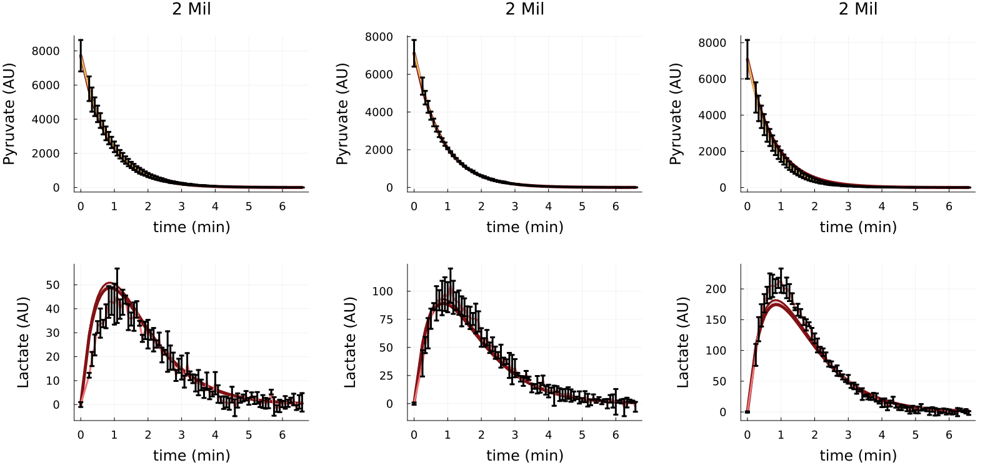

In [34]:
pp1 = plot(tsC2./60, PosterQuant[1,1,1], label = "", color = "#821114ff", linewidth = 5,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)", title = "2 Mil")
  plot!(tsC2./60, PosterQuant[2,1,1], label = "", color = "#821114ff", linewidth = 3)
  plot!(tsC2./60, PosterQuant[2,1,1], fillrange=PosterQuant[1,1,1], label="", color="#821114ff", fillalpha=0.2)
  plot!(tsC2./60, dat[1][:,2], yerror = dat[1][:,3], linewidth = 3, colour = "#eaba61ff", label = "")

pp2 = plot(tsC2./60, PosterQuant[1,2,1], label = "", color = "#821114ff", linewidth = 3,
  margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
  xlabel = "time (min)", ylabel = "Lactate (AU)")
  plot!(tsC2./60, PosterQuant[2,2,1], label = "", color = "#821114ff", linewidth = 5)
  plot!(tsC2./60, PosterQuant[2,2,1], fillrange=PosterQuant[1,2,1], label="", color="#821114ff", fillalpha=0.2)
  plot!(tsC2./60, dat[1][:,4], yerror = dat[1][:,5], linewidth = 3, colour = "#ed7679ff", label = "")


P1 = plot(pp1,pp2, layout=(2,1), size = (800,750), margin = 8mm, xguidefontsize=16, yguidefontsize=16, tickfontsize=12)



pp1 = plot(tsC2./60, PosterQuant[1,1,2], label = "", color = "#821114ff", linewidth = 5,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)", title = "2 Mil")
  plot!(tsC2./60, PosterQuant[2,1,2], label = "", color = "#821114ff", linewidth = 3)
  plot!(tsC2./60, PosterQuant[2,1,2], fillrange=PosterQuant[1,1,2], label="", color="#821114ff", fillalpha=0.2)
  plot!(tsC2./60, dat[2][:,2], yerror = dat[2][:,3], linewidth = 3, colour = "#eaba61ff", label = "")

pp2 = plot(tsC2./60, PosterQuant[1,2,2], label = "", color = "#821114ff", linewidth = 3,
  margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
  xlabel = "time (min)", ylabel = "Lactate (AU)")
  plot!(tsC2./60, PosterQuant[2,2,2], label = "", color = "#821114ff", linewidth = 5)
  plot!(tsC2./60, PosterQuant[2,2,2], fillrange=PosterQuant[1,2,2], label="", color="#821114ff", fillalpha=0.2)
  plot!(tsC2./60, dat[2][:,4], yerror = dat[2][:,5], linewidth = 3, colour = "#ed7679ff", label = "")


P2 = plot(pp1,pp2, layout=(2,1), size = (800,750), margin = 8mm, xguidefontsize=16, yguidefontsize=16, tickfontsize=12)


pp1 = plot(tsC2./60, PosterQuant[1,1,3], label = "", color = "#821114ff", linewidth = 5,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)", title = "2 Mil")
  plot!(tsC2./60, PosterQuant[2,1,3], label = "", color = "#821114ff", linewidth = 3)
  plot!(tsC2./60, PosterQuant[2,1,3], fillrange=PosterQuant[1,1,3], label="", color="#821114ff", fillalpha=0.2)
  plot!(tsC2./60, dat[3][:,2], yerror = dat[3][:,3], linewidth = 3, colour = "#eaba61ff", label = "")

pp2 = plot(tsC2./60, PosterQuant[1,2,3], label = "", color = "#821114ff", linewidth = 3,
  margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
  xlabel = "time (min)", ylabel = "Lactate (AU)")
  plot!(tsC2./60, PosterQuant[2,2,3], label = "", color = "#821114ff", linewidth = 5)
  plot!(tsC2./60, PosterQuant[2,2,3], fillrange=PosterQuant[1,2,3], label="", color="#821114ff", fillalpha=0.2)
  plot!(tsC2./60, dat[3][:,4], yerror = dat[3][:,5], linewidth = 3, colour = "#ed7679ff", label = "")


P3 = plot(pp1,pp2, layout=(2,1), size = (800,750), margin = 8mm, xguidefontsize=16, yguidefontsize=16, tickfontsize=12)


pF = plot(P1,P2,P3, layout=(1,3), size = (1600,750))


savefig("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\SVGsInit\\PosteriorPredictionAllNoTransporter.svg")


display(pF)

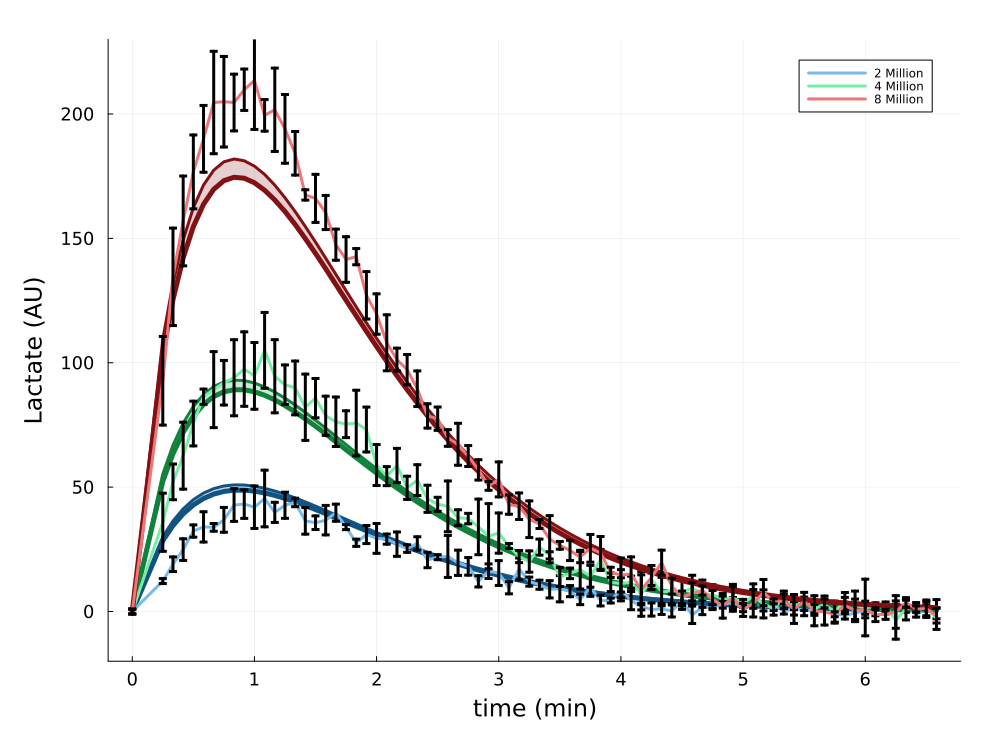

In [40]:
pp2 = plot(tsC2./60, PosterQuant[1,2,1], label = "", color = "#115382ff", linewidth = 3,
        margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
        xlabel = "time (min)", ylabel = "Lactate (AU)")
        plot!(tsC2./60, PosterQuant[2,2,1], label = "", color = "#115382ff", linewidth = 5)
        plot!(tsC2./60, PosterQuant[2,2,1], fillrange=PosterQuant[1,2,1], label="", color="#115382ff", fillalpha=0.2)
        plot!(tsC2./60, dat[1][:,4], yerror = dat[1][:,5], linewidth = 3, colour = "#76bbedff", label = "2 Million")


        plot!(tsC2./60, PosterQuant[1,2,2], label = "", color = "#11823cff", linewidth = 3,
        margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
        xlabel = "time (min)", ylabel = "Lactate (AU)")
        plot!(tsC2./60, PosterQuant[2,2,2], label = "", color = "#11823cff", linewidth = 5)
        plot!(tsC2./60, PosterQuant[2,2,2], fillrange=PosterQuant[1,2,2], label="", color="#11823cff", fillalpha=0.2)
        plot!(tsC2./60, dat[2][:,4], yerror = dat[2][:,5], linewidth = 3, colour = "#76eda4ff", label = "4 Million")

        plot!(tsC2./60, PosterQuant[1,2,3], label = "", color = "#821114ff", linewidth = 3,
        margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
        xlabel = "time (min)", ylabel = "Lactate (AU)")
        plot!(tsC2./60, PosterQuant[2,2,3], label = "", color = "#821114ff", linewidth = 5)
        plot!(tsC2./60, PosterQuant[2,2,3], fillrange=PosterQuant[1,2,3], label="", color="#821114ff", fillalpha=0.2)
        plot!(tsC2./60, dat[3][:,4], yerror = dat[3][:,5], linewidth = 3, colour = "#ed7679ff", label = "8 Million")

pFF = plot(pp2, size = (1000,750), margin = 8mm, xguidefontsize=16, yguidefontsize=16, tickfontsize=12, ylim=(-20,230))


savefig("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\SVGsInit\\PosteriorPredictionLactateNoTransporter.svg")


display(pFF)

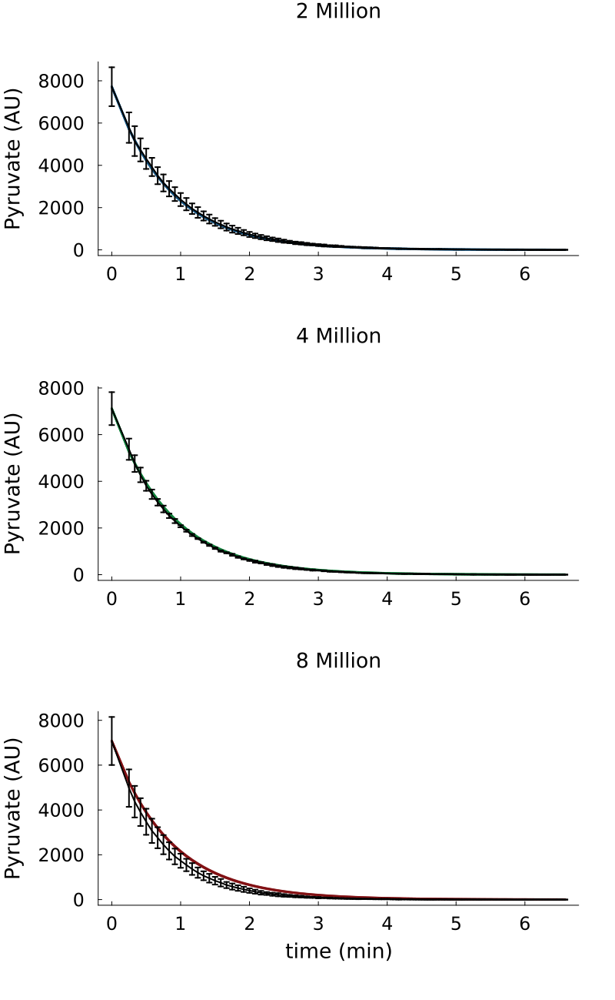

In [16]:

m=1
pr1 = plot(tsC2./60, PosterQuant[1,1,m]+PosterQuant[1,2,m], label = "", color = "#115382ff", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "", ylabel = "Pyruvate (AU)", grid = false, size = (1000,500), title = "2 Million")
  plot!(tsC2./60, PosterQuant[2,1,m]+PosterQuant[2,2,m], label = "", color = "#115382ff", linewidth = 3)
  plot!(tsC2./60, PosterQuant[2,1,m]+PosterQuant[2,2,m], fillrange=PosterQuant[1,1,m]+PosterQuant[1,2,m], label="", color="#115382ff", fillalpha=0.2)
  plot!(tsC2./60, dat[m][:,2], yerror = dat[m][:,3], linewidth = 2, colour = "black", label = "")


  m=2
pr2 = plot(tsC2./60, PosterQuant[1,1,m]+PosterQuant[1,2,m], label = "", color = "#11823cff", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "", ylabel = "Pyruvate (AU)", grid = false, size = (1000,500), title = "4 Million")
  plot!(tsC2./60, PosterQuant[2,1,m]+PosterQuant[2,2,m], label = "", color = "#11823cff", linewidth = 3)
  plot!(tsC2./60, PosterQuant[2,1,m]+PosterQuant[2,2,m], fillrange=PosterQuant[1,1,m]+PosterQuant[1,2,m], label="", color="#11823cff", fillalpha=0.2)
  plot!(tsC2./60, dat[m][:,2], yerror = dat[m][:,3], linewidth = 2, colour = "black", label = "")


  m=3
pr3 = plot(tsC2./60, PosterQuant[1,1,m]+PosterQuant[1,2,m], label = "", color = "#821114ff", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)", grid = false, size = (1000,500), title = "8 Million")
  plot!(tsC2./60, PosterQuant[2,1,m]+PosterQuant[2,2,m], label = "", color = "#821114ff", linewidth = 3)
  plot!(tsC2./60, PosterQuant[2,1,m]+PosterQuant[2,2,m], fillrange=PosterQuant[1,1,m]+PosterQuant[1,2,m], label="", color="#821114ff", fillalpha=0.2)
  plot!(tsC2./60, dat[m][:,2], yerror = dat[m][:,3], linewidth = 2, colour = "black", label = "")


PPR = plot(pr1,pr2,pr3, layout=(3,1), size = (800,1300))

savefig("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\SuppFig1Stuff\\PosteriorPredictionPyruvate.svg")

display(PPR)


#### No CO2 Comparison

In [13]:
C4 = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\8Mil_Dat.csv", DataFrame));
L4 = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\8Mil_NoCO2_Dat.csv", DataFrame));

In [34]:
tsC8 = dat8[:,1]
ts = 0:tsC8[end];
ivss = [dat8[1,2], dat8[1,4]];
samps = convert.(Int, tsC8);
SimOnTime3poster8, SimOffTime3poster8, SimAll3poster8 = PyruvateHP_NMR_SolveAll(ts, hcat(poster[1:700,1:2].*8, poster[1:700,4], poster[1:700,3], zeros(700)), ivss, samps);

SimOnTime3poster82, SimOffTime3poster82, SimAll3poster82 = PyruvateHP_NMR_SolveAll(ts, hcat(poster[1:700,1:2].*5, poster[1:700,4], poster[1:700,3], zeros(700)), ivss, samps);

posterSims8 = [SimOnTime3poster8, SimOnTime3poster82]

PosterQuant8 = Array{Any}(undef,2,2,length(posterSims8));
for k in 1:2
    for m in 1:length(posterSims8)
        PosterQuant8[1,k,m] = [percentile(posterSims8[m][j,k,:], 99.5) for j in 1:size(posterSims8[m][:,k,1])[1]]; # Up
        PosterQuant8[2,k,m] = [percentile(posterSims8[m][j,k,:], 0.5 ) for j in 1:size(posterSims8[m][:,k,1])[1]]; # Down
    end
end

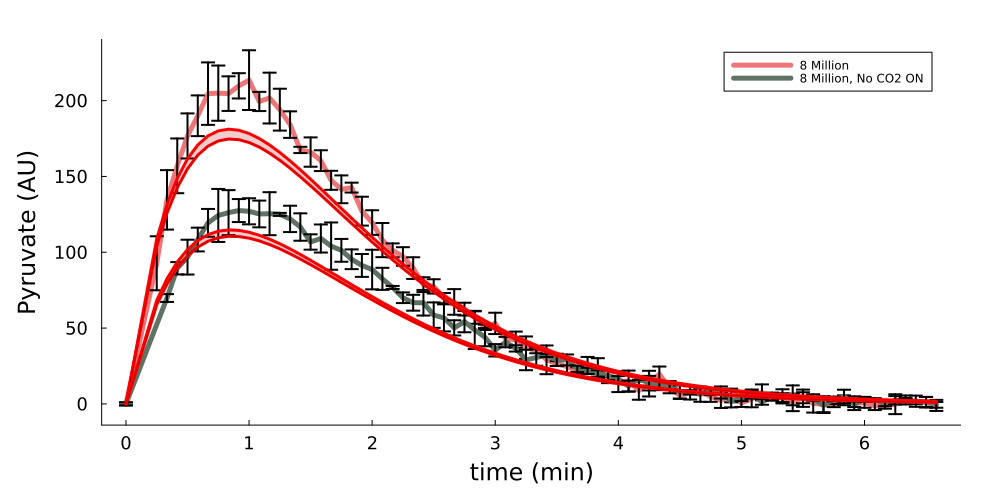

In [35]:
pp2 = plot(C4[:,1]./60, C4[:,4],  label = "8 Million", xlabel="time (min)", ylabel = "Lactate (A.U.)", grid = false, color="#ed7679ff", markersize=7, linewidth=5)
plot!(C4[:,1]./60, C4[:,4], yerror = C4[:,5], label = "", xlabel="time (min)", ylabel = "Lactate (A.U.)", grid = false, color="#ed7679ff", markersize=7, linewidth=2)
plot!((L4[:,1]) ./60, L4[:,4], label = "8 Million, No CO2 ON", xlabel="time (min)", ylabel = "Lactate (A.U.)", grid = false, color="#5F7364", markersize=7, linewidth=5)
plot!((L4[:,1]) ./60, L4[:,4], yerror = L4[:,5], label = "", xlabel="time (min)", ylabel = "Lactate (A.U.)", grid = false, color="#5F7364", markersize=7, linewidth=2)


m = 1
plot!(tsC2./60, PosterQuant8[1,2,m], label = "", color = "red", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
plot!(tsC2./60, PosterQuant8[2,2,m], label = "", color = "red", linewidth = 3)
plot!(tsC2./60, PosterQuant8[2,2,m], fillrange=PosterQuant8[1,2,m], label="", color="red3", fillalpha=0.2)


m = 2
plot!(tsC2./60, PosterQuant8[1,2,m], label = "", color = "red", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
plot!(tsC2./60, PosterQuant8[2,2,m], label = "", color = "red", linewidth = 3)
plot!(tsC2./60, PosterQuant8[2,2,m], fillrange=PosterQuant8[1,2,m], label="", color="red3", fillalpha=0.2)




pp=plot(pp2, size = (1000,500), margin = 8mm, xguidefontsize=16, yguidefontsize=16, tickfontsize=12)

In [36]:
using Trapz

In [38]:
trapz(C4[:,1], C4[:,4])

26074.901674500023

In [39]:
trapz(L4[:,1], L4[:,4])

18006.471460279998

## nRMSE 

In [13]:
using JLD2

In [14]:
nRMSE = zeros(3,8000);
nRMSE_pyr = zeros(3,8000);
nRMSE_lac = zeros(3,8000);

m = 1 # Experiment

k = 1; # Sample number
for m in 1:3
    for k in 1:8000

        pyrtmp = sqrt(sum(((posterSims[m][2:end,1,k].-dat[m][2:end,2]).^2)./dat[m][2:end,3].^2)/length(dat[m][2:end,2]));
        lactmp = sqrt(sum(((posterSims[m][2:end,2,k].-dat[m][2:end,4]).^2)./dat[m][2:end,5].^2)/length(dat[m][2:end,4]));
        msetmp = (pyrtmp + lactmp)/2;

        nRMSE[m,k] = msetmp + log(4*log(2*77));
        nRMSE_pyr[m,k] = pyrtmp + log(4*log(2*77));
        nRMSE_lac[m,k] = lactmp + log(4*log(2*77));

    end
end

println("nRMSE total: "*string(sum(sum(nRMSE, dims=2)/8000)))
println("nRMSE pyruvate: "*string(sum(sum(nRMSE_pyr, dims=2)/8000)))
println("nRMSE lactate: "*string(sum(sum(nRMSE_lac, dims=2)/8000)))

nRMSE total: 13.989509551525243
nRMSE pyruvate: 13.335654716791066
nRMSE lactate: 14.643364386259519


In [17]:
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\Results\\nRMSENoTransp.jld", "nRMSE", nRMSE, "nRMSE_pyr", nRMSE_pyr, "nRMSE_lac", nRMSE_lac)
CSV.write("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\Results\\nRMSENoTransp.csv", DataFrame(nRMSE, :auto))

"C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\Results\\nRMSENoTransp.csv"

## BIC

In [26]:
BIC = zeros(3,8000);
BIC_pyr = zeros(3,8000);
BIC_lac = zeros(3,8000);

m = 1 # Experiment
k = 1; # Sample number
for m in 1:3
    for k in 1:8000


        BIC[m,k] = sum(((posterSims[m][2:end,1,k].-dat[m][2:end,2]).^2)./dat[m][2:end,3].^2) + sum(((posterSims[m][2:end,2,k].-dat[m][2:end,4]).^2)./dat[m][2:end,5].^2) + (4*log(2*length(posterSims[m][2:end,1,k])));
        BIC_pyr[m,k] = sum(((posterSims[m][2:end,1,k].-dat[m][2:end,2]).^2)./dat[m][2:end,3].^2) + (4*log(length(posterSims[m][2:end,1,k])));
        BIC_lac[m,k] = sum(((posterSims[m][2:end,2,k].-dat[m][2:end,4]).^2)./dat[m][2:end,5].^2) + (4*log(length(posterSims[m][2:end,1,k])));;

    end
end

println("BIC total: "*string(sum(sum(BIC, dims=2)/8000)))
println("BIC pyruvate: "*string(sum(sum(BIC_pyr, dims=2)/8000)))
println("BIC lactate: "*string(sum(sum(BIC_lac, dims=2)/8000)))

BIC total: 1557.1320175869332
BIC pyruvate: 602.3760926248087
BIC lactate: 998.5638238576469


In [27]:
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\Results\\BICNoTransp.jld", "BIC", BIC, "BIC_pyr", BIC_pyr, "BIC_lac", BIC_lac)
CSV.write("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\Results\\BICNoTransp.csv", DataFrame(BIC, :auto))

"C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\Results\\BICNoTransp.csv"

## Plot Effect of Transporter in Fit

In [19]:
posterTransp = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\Results\\PosteriorTransp.csv", DataFrame));

In [34]:
tsC8 = dat4[:,1]
ts = 0:tsC4[end];
ivss = [dat4[1,2], 0, dat4[1,4]];
samps = convert.(Int, tsC4);
SimOnTran, SimOffTimeTran, SimAllTran  = PyruvateHP_NMR_SolveAllTb(ts, hcat(poster[:,1:2].*4, poster[:,4], poster[:,3], posterTransp[:,5].*4, zeros(8000)), ivss, samps);

In [35]:
PosterQuantTrans = Array{Any}(undef,2,3);

for k in 1:3
    PosterQuantTrans[1,k] = [percentile(SimOnTran[j,k,:], 99.5) for j in 1:size(SimOnTran[:,k,1])[1]]; # Up
    PosterQuantTrans[2,k] = [percentile(SimOnTran[j,k,:], 0.5 ) for j in 1:size(SimOnTran[:,k,1])[1]]; # Down
end

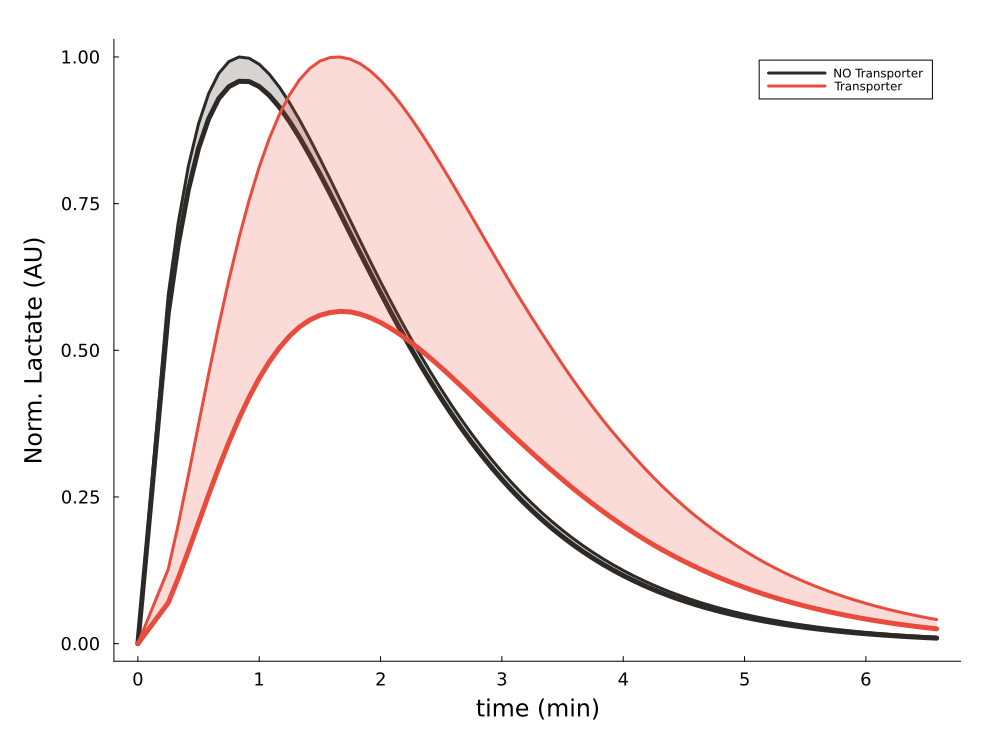

In [40]:
ppt = plot(tsC2./60, PosterQuant[1,2,2]/maximum(PosterQuant[1,2,2]), label = "NO Transporter", color = "#2D2926FF", linewidth = 3,
        margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
        xlabel = "time (min)", ylabel = "Norm. Lactate (AU)")
        plot!(tsC2./60, PosterQuant[2,2,2]/maximum(PosterQuant[1,2,2]), label = "", color = "#2D2926FF", linewidth = 5)
        plot!(tsC2./60, PosterQuant[2,2,2]/maximum(PosterQuant[1,2,2]), fillrange=PosterQuant[1,2,2]/maximum(PosterQuant[1,2,2]), label="", color="#2D2926FF", fillalpha=0.2)


        plot!(tsC2./60, PosterQuantTrans[1,3]/maximum(PosterQuantTrans[1,3]), label = "Transporter", color = "#E94B3CFF", linewidth = 3,
        margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
        xlabel = "time (min)", ylabel = "Norm. Lactate (AU)")
        plot!(tsC2./60, PosterQuantTrans[2,3]/maximum(PosterQuantTrans[1,3]), label = "", color = "#E94B3CFF", linewidth = 5)
        plot!(tsC2./60, PosterQuantTrans[2,3]/maximum(PosterQuantTrans[1,3]), fillrange=PosterQuantTrans[1,3]/maximum(PosterQuantTrans[1,3]), label="", color="#E94B3CFF", fillalpha=0.2)


pFF2 = plot(ppt, size = (1000,750), margin = 8mm, xguidefontsize=16, yguidefontsize=16, tickfontsize=12, grid = false)

savefig("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\SVGsInit\\PlayModelWithWithoutTransport.svg")


display(pFF2)